## Modelowanie układów przepływowych - ćwiczenia
#### (budowa solwera równań płytkiej wody na bazie pakietu PyMPDATA)

In [39]:
import sys
if 'google.colab' in sys.modules:
    !pip --quiet install open-atmos-jupyter-utils
    from open_atmos_jupyter_utils import pip_install_on_colab
    pip_install_on_colab('PyMPDATA-examples')

### 0. potrzebne pakiety Pythona

In [40]:
import numpy as np
from matplotlib import pyplot
from open_atmos_jupyter_utils import show_plot, show_anim
from PyMPDATA import ScalarField, Solver, Stepper, VectorField, Options, boundary_conditions
import pint
import numba
numba.set_num_threads(1)

In [41]:
!pip install pint

# 1. Przedstawienie problemu

W niniejszym sprawozdaniu przedstawiono symulację przepływu wody przez koryto rzeki w dwóch wariantach fizycznych.

Pierwszy problem polega na zdefiniowaniu koryta rzeki jako równego, obniżającego się do maksymalnej głębokości w jej środkowej części, z wyraźnie określonym brzegiem, poza który woda nie może wypłynąć (nie może się przelać). Sama rzeka ma niewielki spadek wzdłuż kierunku potencjalnego przepływu (rzeka płynie z góry na dół).

Drugi problem dotyczy sytuacji, w której w centralnej części rzeki występuje istotne wyniesienie, natomiast w pobliżu brzegów znajdują się najglebsze obszary. Taki przypadek mógłby wystąpić np. w sytuacji, gdy przez środek rzeki przepływała łódź, zrzucając za sobą mieszaninę piasku i żwiru, tworząc w ten sposób nietypowe wypiętrzenie dna.

Oba problemy fizyczne analizowane są przy identycznych warunkach początkowych; różnią się jedynie „znakiem” batymetrii. Wszystkie wymiary opisujące koryto rzeki (szczegółowo przedstawione przy definicji funkcji generującej jego kształt) zostały podane w metrach.

W pierwszym przypadku głębokość rzeki wynosi 0.35-0.45 m i spada wraz z kierunkiem przeplywu. Szerokość koryta jest zadana za pomocą odchylenia standardowego funkcji Gaussa, które tutaj ma wartość grid[1]/10 = 14 [m]. Ponieważ maska kanału obejmuje cały obszar, w którym profil Gaussa przekracza 0.1% maksymalnej głębokości:
Szerokość strefy, w której profil Gaussa spełnia warunek  
`exp(-(x^2)/(2σ²)) > 0.1%`

Wyznaczając ∣x∣ z równania powyżej otrzymujemy, że rzeczywista szerokość rzeki wynosi około 100 m (około 2 * 3.72 * σ ≈ 104 m).
Poza tym ustalono wychylenie meandrów na poziomie grid[1]/8 = 17,5 [m], co odpowiada 35 m różnicy między najwyższym a najniższym położeniem brzegu

Początkowym zaburzeniem wybieranym przez użytkownika w ramach projektu jest fala o określonym kształcie na wlocie rzeki, która ma rozprzestrzenić się wzdłuż koryta, powodując symulację przepływu cieczy, a więc symulację rzeki.
Tutaj wybrano fale w postaci narastającej, która powinna być bardziej realistyczna - jej maksymalna wysokość wynosi 2 m.

Dla drugiej sytuacji rozmiary koryta są takie same.


# 2. solwer "hello-world" zbudowany na bazie PyMPDATA

In [42]:
class ShallowWaterEquationsIntegrator:
    def __init__(self, *, h_initial: np.ndarray, bathymetry: np.ndarray, options: Options = None):
        """ initializes the solvers for a given initial condition of `h` assuming zero momenta at t=0 """
        options = options or Options(nonoscillatory=True, infinite_gauge=True)
        self.bathymetry = bathymetry
        X, Y, grid = 0, 1, h_initial.shape
        stepper = Stepper(options=options, grid=grid)
        kwargs = {
            'boundary_conditions': [boundary_conditions.Constant(value=0)] * len(grid),
            'halo': options.n_halo,
        }
        advectees = {
            "h": ScalarField(h_initial, **kwargs),
            "uh": ScalarField(np.zeros(grid), **kwargs),
            "vh": ScalarField(np.zeros(grid), **kwargs),
            # "uh": ScalarField(uh_initial, **kwargs),
            # "vh": ScalarField(vh_initial, **kwargs),

        }
        self.advector = VectorField((
                np.zeros((grid[X] + 1, grid[Y])),
                np.zeros((grid[X], grid[Y] + 1))
            ), **kwargs
        )
        self.solvers = { k: Solver(stepper, v, self.advector) for k, v in advectees.items() }

    def __getitem__(self, key):
        """ returns `key` advectee field of the current solver state """
        return self.solvers[key].advectee.get()

    def _apply_half_rhs(self, *, key, axis, g_times_dt_over_dxy):
        """ applies half of the source term in the given direction """
        self[key][:] -= .5 * g_times_dt_over_dxy * self['h'] * np.gradient(self['h']-self.bathymetry, axis=axis)

    def _update_courant_numbers(self, *, axis, key, mask, dt_over_dxy):
        """ computes the Courant number component from fluid column height and momenta fields """
        velocity = np.where(mask, np.nan, 0)
        momentum = self[key]
        np.divide(momentum, self['h'], where=mask, out=velocity)

        # using slices to ensure views (over copies)
        all = slice(None, None)
        all_but_last = slice(None, -1)
        all_but_first_and_last = slice(1, -1)

        velocity_at_cell_boundaries = velocity[(
            (all_but_last, all),
            (all, all_but_last),
        )[axis]] + np.diff(velocity, axis=axis) / 2
        courant_number = self.advector.get_component(axis)[(
            (all_but_first_and_last, all),
            (all, all_but_first_and_last)
        )[axis]]
        courant_number[:] = velocity_at_cell_boundaries * dt_over_dxy[axis]
        # print(np.amax(np.abs(courant_number)))
        assert np.amax(np.abs(courant_number)) <= 1

    def __call__(self, *, nt: int, g: float, dt_over_dxy: tuple, outfreq: int, eps: float=1e-7):
        """ integrates `nt` timesteps and returns a dictionary of solver states recorded every `outfreq` step[s] """
        output = {k: [] for k in self.solvers.keys()}
        for it in range(nt + 1):
            if it != 0:
                mask = self['h'] > eps
                for axis, key in enumerate(("uh", "vh")):
                    self._update_courant_numbers(axis=axis, key=key, mask=mask, dt_over_dxy=dt_over_dxy)
                self.solvers["h"].advance(n_steps=1)
                for axis, key in enumerate(("uh", "vh")):
                    self._apply_half_rhs(key=key, axis=axis, g_times_dt_over_dxy=g * dt_over_dxy[axis])
                    self.solvers[key].advance(n_steps=1)
                    self._apply_half_rhs(key=key, axis=axis, g_times_dt_over_dxy=g * dt_over_dxy[axis])
            if it % outfreq == 0:
                for key in self.solvers.keys():
                    output[key].append(self[key].copy())
        return output

**Najpierw zdefiniujemy dwie funkcje pomocnicze sluzace do zadania warunkow poczatkowych**

make_river - Funkcja tworząca koryto rzeki (batymetrię). Rzeka opisana jest za pomocą krzywej Gaussa o zmiennym środku (river_center), który wyznaczany jest funkcją sinusoidalną. Funkcja przyjmuje następujące argumenty określające kształt rzeki:
*   szerokosc (river_width) - odchylenie gaussa,
*   glebokosc (river_depth) - amplituda gaussa,
*   wielkosc wychylen meandr (meander_ampl) - amplituda sinusa,
*   ilosc meandr (meander_freq) - czestotliwosc sinusa.

Funkcja zwraca batymetrię (bathymetry_with_river) oraz maskę określającą granice koryta.

Dodanie tak zdefiniowanej batymetrii (linia w funkcji make_river: bath[j] += profile) powoduje uzyskanie kształtu koryta odpowiadającego pierwszej sytuacji - czyli koryta, które staje się coraz głębsze w kierunku środka rzeki.
Jeśli natomiast batymetrię odejmiemy, otrzymamy krzywą Gaussa odwróconą, co odpowiada drugiemu przypadkowi: wypiętrzeniu w centralnej części rzeki oraz największej głębokości przy jej (w tym wariancie) ostrych brzegach.



make_inflow_wave - Funkcja generująca falę początkową na wejściu do koryta rzeki. Dostępne są trzy typy fal, wybierane za pomocą parametru mode:

        "gauss"        – Gauss dopasowany do przekroju rzeki
        "flat"         – płaska fala w korycie
        "flat_tapered" – płaska fala z łagodnym wprowadzeniem - bardziej realistyczna
Zwraca 'zete', czyli poczatkowe zaburzenie, ktore potem dodajemy do 'h_initial'.




In [43]:
def make_river(bathymetry, grid, problem,
               river_width,
               river_depth,
               meander_ampl,
               meander_freq):

    Ny, Nx = grid
    x = np.arange(Nx)
    y = np.arange(Ny)

    # 1. meandrujący środek rzeki
    river_center_x = Nx//2 + meander_ampl * np.sin(meander_freq * y)

    # 2. tworzenie koryta + maski
    bath = bathymetry.copy()
    mask = np.zeros_like(bath, dtype=bool)

    for j in range(Ny):
        profile = river_depth * np.exp(-((x - river_center_x[j])**2) /
                                       (2*river_width**2))
        bath[j] += -profile if problem == 2 else profile

        mask[j] = profile > (0.001 * river_depth)

    return bath, mask, river_center_x

def make_inflow_wave(grid, channel_mask, mode="gauss",
                     profile_0=None,
                     river_depth=1.0,
                     amplitude=0.2,
                     taper_rows=6):

    Ny, Nx = grid
    zeta = np.zeros((Ny, Nx))

    if mode == "gauss":
        zeta[0, channel_mask] = amplitude * profile_0[channel_mask] / river_depth
        return zeta

    if mode == "flat":
        zeta[0, channel_mask] = amplitude
        return zeta

    if mode == "flat_tapered":
        for j in range(min(taper_rows, Ny)):
            weight = 0.5 * (1 - np.cos(np.pi * (j+1) / taper_rows))
            zeta[j, channel_mask] = amplitude * weight
        return zeta

    raise ValueError(f"Unknown mode '{mode}'.")

# 3. Rozwiazanie projektu - sytuacja 1

Najpierw definiujemy siatkę oraz jej rozmiar. W tym układzie współrzędnych oś Y odpowiada długości rzeki (kierunek przepływu), natomiast oś X przebiega w poprzek koryta.

Następnie definiujemy bazową batymetrię z niewielkim spadkiem, po czym generujemy właściwe koryto rzeki.

Kolejnym krokiem jest zadanie fali początkowej.

Na końcu tworzymy stan początkowy wody i uruchamiamy integrator.

In [44]:
# ================================
# 1. Siatka
# ================================
si = pint.UnitRegistry()
grid = (150, 140)

# współrzędne do bathymetrii (0..1)
x_lin = np.linspace(0, 1, grid[1])
y_lin = np.linspace(0, 1, grid[0])
X, Y = np.meshgrid(x_lin, y_lin)

# bazowa bathymetria – lekki spadek wzdluz kierunku przeplywu
bathymetry = (0.05 + 0.1 * Y)


# ================================
# 2. Geometria rzeki (meandry)
# ================================
river_width  = grid[1] / 10             # szerokość koryta
river_depth  = 0.3                      # głębokość koryta
meander_ampl = grid[1] / 8              # amplituda meandru
meander_freq = 2*np.pi / grid[0]        # 1 pełen meander na wysokość domeny

# ================================
# 3. Budowa rzeki (koryta) - bathymetrii
# ================================
bathymetry_with_river, channel_mask_full, river_center_x = make_river(
    bathymetry,
    grid,
    1,
    river_width,
    river_depth,
    meander_ampl,
    meander_freq
)

# ================================
# 4. Początkowe zaburzenie wody (fala wejściowa)
# ================================

# channel_mask dla wiersza 0
channel_mask = channel_mask_full[0, :]
profile_0 = river_depth * np.exp(-((x_lin - river_center_x[0])**2) / (2*river_width**2))


zeta = make_inflow_wave(grid, channel_mask,
    mode="flat_tapered",
    profile_0=profile_0,
    river_depth=river_depth,
    amplitude=0.2,
)

# ================================
# 5. Początkowy stan wody
# ================================
h_initial = bathymetry_with_river + zeta

# ================================
# 6. Integracja SW
# ================================
output05 = ShallowWaterEquationsIntegrator(
    h_initial=h_initial, bathymetry=bathymetry_with_river
)(
    nt=200, g=10, dt_over_dxy=(0.05, 0.05), outfreq=(outfreq := 3)
)

output30 = ShallowWaterEquationsIntegrator(
    h_initial=h_initial, bathymetry=bathymetry_with_river
)(
    nt=200, g=10, dt_over_dxy=(0.3, 0.3), outfreq=(outfreq := 3)
)


Przed wykonaniem animacji warto sprawdzić i wizualnie przeanalizować początkową falę. W tym celu narysujemy jej przekrój na wejściu do domeny (zeta[0, :]), a także wykonamy rzut z góry przedstawiający koryto rzeki wraz z początkową falą.

W tym przykładzie wykorzystano falę typu tapered, ponieważ jest ona najbardziej realistyczna. Poniżej przedstawiono przekrój początkowego zaburzenia dla y=0. Wysokość 0.014 m odpowiada początkowej wartości fali, która następnie narasta zgodnie z definicją profilu flat_tapered, aż do zadanej amplitudy 0.2m
Jeszcze niżej pokazano rzut z góry z naniesionym początkowym zaburzeniem. Kolorystyka przedstawia wysokość wychylenia - dzięki temu narastającą falę można zaobserwować wyraźniej.

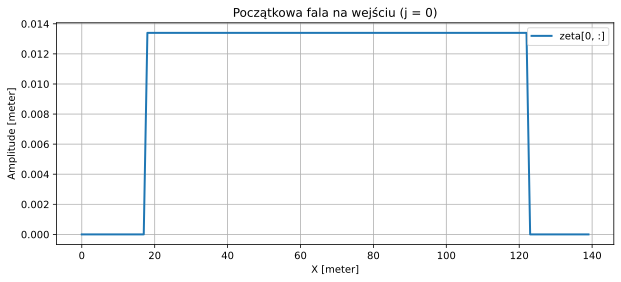

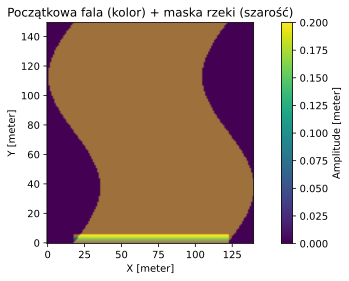

In [45]:
si = pint.UnitRegistry()

pyplot.figure(figsize=(10, 4))
pyplot.plot(zeta[0], label="zeta[0, :]", linewidth=2)
pyplot.title("Początkowa fala na wejściu (j = 0)")
pyplot.xlabel(f"X [{si.m}]")
pyplot.ylabel(f"Amplitude [{si.m}]")
pyplot.grid(True)
pyplot.legend()
pyplot.show()

pyplot.figure(figsize=(10, 4))

im = pyplot.imshow(zeta, origin='lower', cmap='viridis')
cbar = pyplot.colorbar(im)
cbar.set_label(f"Amplitude [{si.m}]")
pyplot.imshow(channel_mask_full, origin='lower', alpha=0.7)

pyplot.title("Początkowa fala (kolor) + maska rzeki (szarość)")
pyplot.xlabel(f"X [{si.m}]")
pyplot.ylabel(f"Y [{si.m}]")
pyplot.show()


### 4. Wizualizacja - sytuacja 1

***Funkcje pomocnicze do rysowania wynikow.***

imshow_river - rysuje dwuwymiarową mapę (widok z góry) wysokości słupa wody h w rzece.
Funkcja przyjmuje dwa zestawy wyników (umożliwiając ich porównanie) oraz numer klatki do wyświetlenia.

quiver_river - rysuje pole wektorowe prędkości wody w rzece.
Przyjmuje te same argumenty co imshow_river, a dodatkowo parametr step, który określa gęstość prezentowanych „strzałek” wektorów.

In [46]:
def imshow_river(frame_to_show,
                 output1, bathymetry1, channel_mask1,
                 output2, bathymetry2, channel_mask2):

    # Dzeta dla pierwszej symulacji
    dzeta1 = (output1['h'][frame_to_show] - bathymetry1) * channel_mask1
    ny1, nx1 = dzeta1.shape
    extent1 = [0, nx1, 0, ny1]

    # Dzeta dla drugiej symulacji
    dzeta2 = (output2['h'][frame_to_show] - bathymetry2) * channel_mask2
    ny2, nx2 = dzeta2.shape
    extent2 = [0, nx2, 0, ny2]

    fig, axes = pyplot.subplots(1, 2, figsize=(14,6))
    im1 = axes[0].imshow(dzeta1, origin='lower', cmap='Blues', extent=extent1)
    axes[0].set_title(f'Output 1, frame {frame_to_show}')
    axes[0].set_xlabel(f"x [{si.m:~}]")
    axes[0].set_ylabel(f"y [{si.m:~}]")
    fig.colorbar(im1, ax=axes[0], label='Wysokość wody [m]')
    im2 = axes[1].imshow(dzeta2, origin='lower', cmap='Blues', extent=extent2)
    axes[1].set_title(f'Output 2, frame {frame_to_show}')
    axes[1].set_xlabel(f"x [{si.m:~}]")
    axes[1].set_ylabel(f"y [{si.m:~}]")

    fig.colorbar(im2, ax=axes[1], label='Wysokość wody [m]')

    pyplot.tight_layout()
    pyplot.show()


def quiver_river(frame_to_show,
                 output1, channel_mask1,
                 output2, channel_mask2,
                 step=3):
    # Dane z pierwszej symulacji
    U1 = output1['uh'][frame_to_show] * channel_mask1
    V1 = output1['vh'][frame_to_show] * channel_mask1
    X1, Y1 = np.meshgrid(np.arange(U1.shape[1]), np.arange(U1.shape[0]))
    X1_sample = X1[::step, ::step]
    Y1_sample = Y1[::step, ::step]
    U1_sample = U1[::step, ::step]
    V1_sample = V1[::step, ::step]

    # Dane z drugiej symulacji
    U2 = output2['uh'][frame_to_show] * channel_mask2
    V2 = output2['vh'][frame_to_show] * channel_mask2
    X2, Y2 = np.meshgrid(np.arange(U2.shape[1]), np.arange(U2.shape[0]))
    X2_sample = X2[::step, ::step]
    Y2_sample = Y2[::step, ::step]
    U2_sample = U2[::step, ::step]
    V2_sample = V2[::step, ::step]

    fig, axes = pyplot.subplots(1, 2, figsize=(14,6))
    axes[0].quiver(X1_sample, Y1_sample, U1_sample, V1_sample)
    axes[0].set_title(f'Output 1, frame {frame_to_show}')
    axes[0].set_xlabel(f"x [{si.m:~}]")
    axes[0].set_ylabel(f"y [{si.m:~}]")
    axes[1].quiver(X2_sample, Y2_sample, U2_sample, V2_sample)
    axes[1].set_title(f'Output 2, frame {frame_to_show}')
    axes[1].set_xlabel(f"x [{si.m:~}]")
    axes[1].set_ylabel(f"y [{si.m:~}]")

    pyplot.tight_layout()
    pyplot.show()



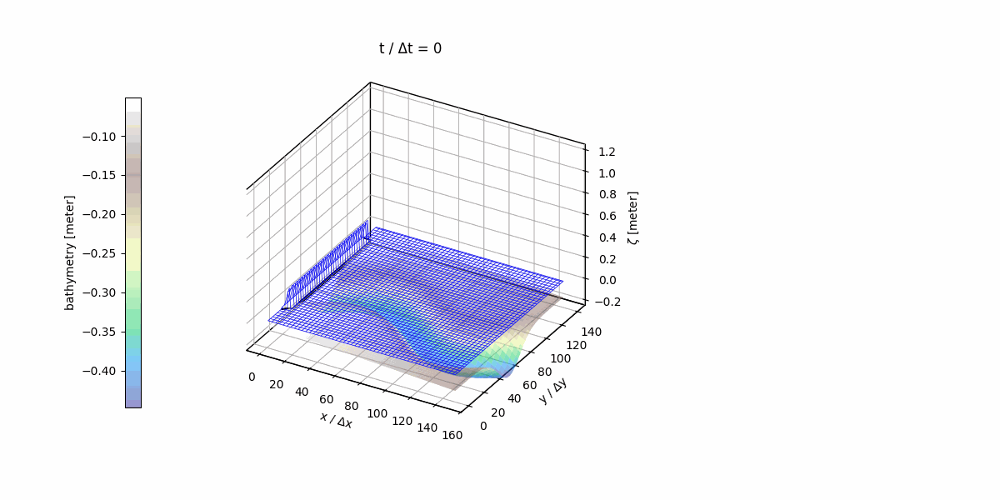

Button(description='tmp8a09mmyv.gif', style=ButtonStyle())

In [47]:
def plot(frame, *, zlim=(-.25, 1.25)):

    psi = output30['h'][frame]
    water_height = (psi - bathymetry_with_river) * channel_mask_full

    xi, yi = np.indices(psi.shape)
    fig, ax = pyplot.subplots(subplot_kw={"projection": "3d"}, figsize=(12, 6))
    ax.plot_wireframe(xi+.5, yi+.5, water_height, color='blue', linewidth=.5)
    ax.set(zlim=zlim, proj_type='ortho', title=f"t / Δt = {frame*outfreq}", zlabel=f"$\\zeta$ [{si.m}]")


    for axis in (ax.xaxis, ax.yaxis, ax.zaxis):
        axis.pane.fill = False
        axis.pane.set_edgecolor('black')
        axis.pane.set_alpha(1)
    for axis in ('x', 'y'):
        getattr(ax, f'set_{axis}label')(f"{axis} / Δ{axis}")
    # pyplot.colorbar(
    #     ax.contourf(xi+.5, yi+.5, bathymetry_with_river, zdir='z', offset=zlim[0]),
    #     pad=.1, aspect=10, fraction=.02, label='bathymetry', location='left'
    # ).ax.invert_yaxis()
    surf = ax.plot_surface(xi+.5, yi+.5, -(bathymetry_with_river), cmap='terrain', alpha=0.5)
    pyplot.colorbar(surf, pad=.1, fraction=.02, label=f'bathymetry [{si.m}]', location='left')
    ax.contour(xi+.5, yi+.5, water_height, levels=[0], colors='black', linewidths=1.5)


    return fig
show_anim(plot, range(len(output30['h'])))




Rzut na rzekę z góry - klatka 10 z animacji. Widać początkowe zaburzenie, które zaczyna rozchodzić się wzdłuż koryta. Na osi pionowej przedstawiono zete, czyli wychylenie powierzchni wody ponad jej średnią wysokość. Czarne kontury pokazują miejsca, w których fala osiąga maskę koryta (ustaloną z góry wysokość, powyżej której woda nie powinna się wydostawać).

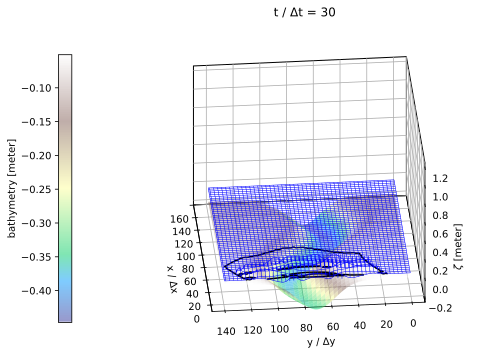

In [48]:
frame_to_show = 10
fig = plot(frame_to_show)
ax = fig.axes[0]
ax.view_init(elev=30, azim=175)
show_plot("Rzut_na_rzeke_klatka10.pdf")
pyplot.show()

Rzut na rzekę z góry - klatka 60.

Na tej klatce woda wciąż reaguje na wejściową perturbację, a kształt fali jest kształtowany przez meandry koryta.

Można przewidzieć, że w kolejnych klatkach fala rozprzestrzeni się i wygładzi.



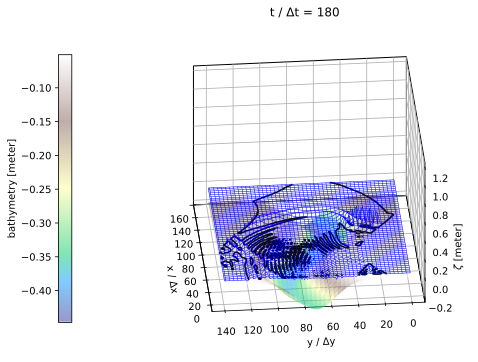

In [49]:
frame_to_show = 60
fig = plot(frame_to_show)
ax = fig.axes[0]
ax.view_init(elev=30, azim=175)
show_plot("Rzut_na_rzeke_klatka60.pdf")
pyplot.show()

Na rysunku ponizej widzimy jak fala rozprzestrzenia sie wzdluz rzeki. Widac to po jej grzbiecie - mocniejszy niebieski.

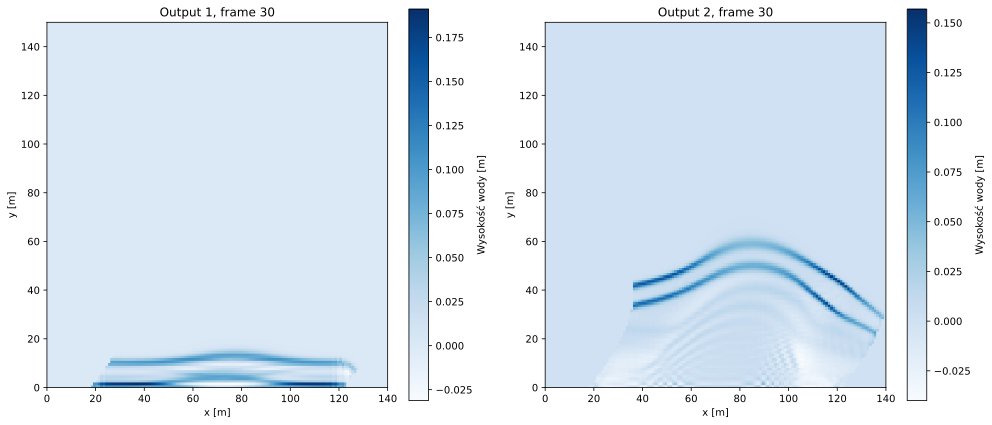

<Figure size 640x480 with 0 Axes>

In [50]:
frame = 30
imshow_river(frame_to_show=frame, output1=output05, output2=output30,
             bathymetry1=bathymetry_with_river, bathymetry2=bathymetry_with_river,
             channel_mask1=channel_mask_full, channel_mask2=channel_mask_full)
show_plot("rzeka_z_gory_sty1_f30.pdf")


Po prawie pełnym czasie obliczeń woda w korycie stabilizuje się - czoło fali zanika, a całe zaburzenie rozchodzi się po całym korycie rzeki.

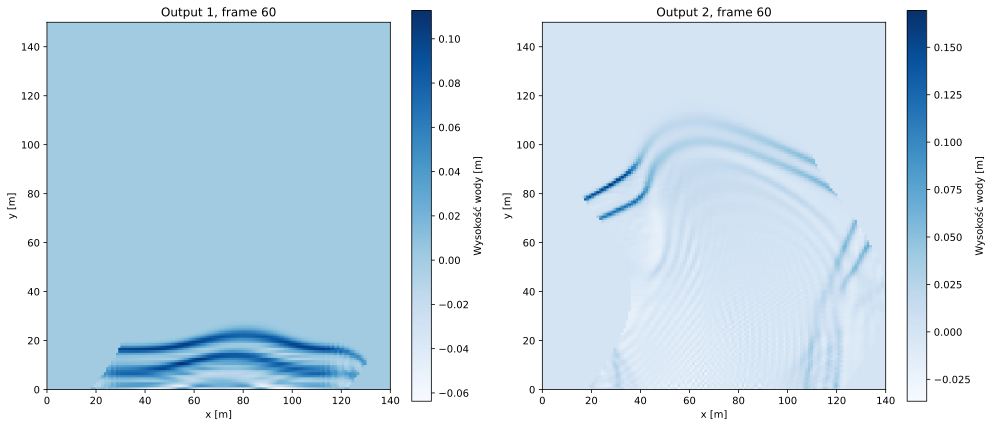

<Figure size 640x480 with 0 Axes>

In [51]:
frame = 60
imshow_river(frame_to_show=frame, output1=output05, output2=output30,
             bathymetry1=bathymetry_with_river, bathymetry2=bathymetry_with_river,
             channel_mask1=channel_mask_full, channel_mask2=channel_mask_full)
show_plot("rzeka_z_gory_sty1_f60.pdf")



Poniżej widać pole prędkości w kroku 30. Obserwujemy duży „chaos” – tworzą się nawet niewielkie, krótkotrwałe wiry. Mogą one wynikać z nałożonych brzegów (maski) oraz początkowego zaburzenia. Strzałki prędkości wskazują kierunek ruchu płynu prostopadły do brzegu, co teoretycznie zgadza się z obserwacją, że fale zawsze docierają do brzegu prostopadle.

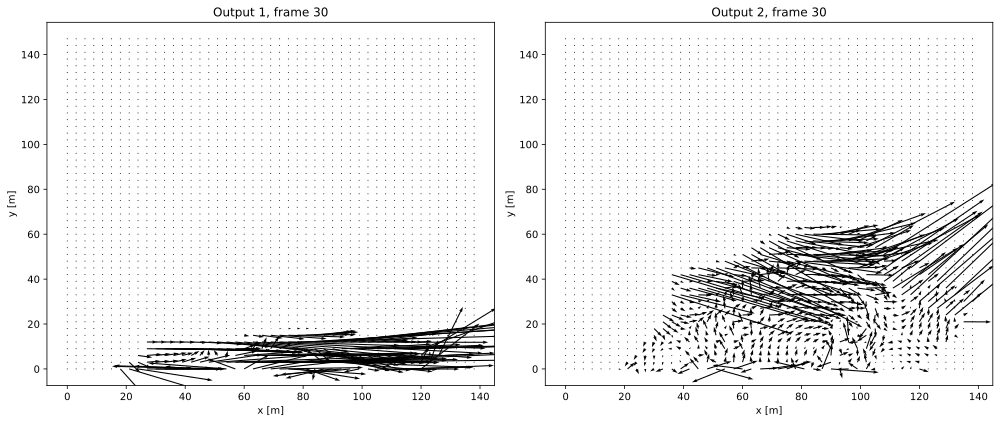

<Figure size 640x480 with 0 Axes>

In [52]:
frame = 30
step = 3
quiver_river(frame_to_show=frame, output1=output05, output2=output30,
             channel_mask1=channel_mask_full, channel_mask2=channel_mask_full, step=step)
show_plot("rzeka_z_gory_v_sty1_f30.pdf")


Po dłuższym czasie integracji rzeka stabilizuje się. Prędkość maleje za czołem fali. Jednak prędkość przy czo­le zachowuje się dość nietypowo – nie jestem w stanie stwierdzić przyczyny, poza możliwymi odbiciami od brzegów w miejscach, gdzie koryto zakręca.

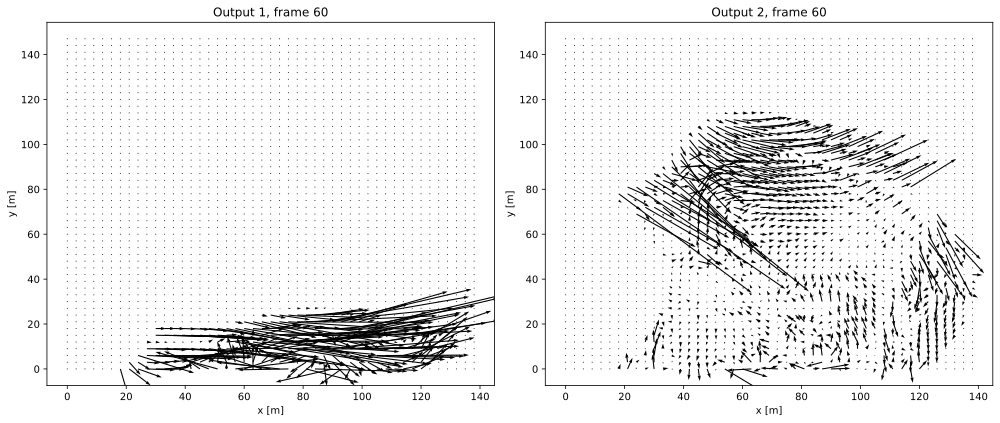

<Figure size 640x480 with 0 Axes>

In [53]:
frame = 60
quiver_river(frame_to_show=frame, output1=output05, output2=output30,
             channel_mask1=channel_mask_full, channel_mask2=channel_mask_full, step=step)
show_plot("rzeka_z_gory_v_sty1_f60.pdf")


Poniżej zbadamy te same rezultaty, ale dla innej siatki (o połowę mniejszej w obu wymiarach). Przy tym samym dt/dx symulacja powinna być mniej dokładna.

In [54]:
#Inna siatka:

grid2 = (75, 70)
x_lin2 = np.linspace(0, 1, grid2[1])
y_lin2 = np.linspace(0, 1, grid2[0])
X, Y = np.meshgrid(x_lin2, y_lin2)

bathymetry2 = (0.05 + 0.1 * Y)
river_width  = grid2[1] / 10             # szerokość koryta
river_depth  = 0.3                      # głębokość koryta
meander_ampl = grid2[1] / 8              # amplituda meandru
meander_freq = 2*np.pi / grid2[0]        # 1 pełen meander na wysokość domeny

bathymetry_with_river2, channel_mask_full2, river_center_x2 = make_river(
    bathymetry2,
    grid2,
    1,
    river_width,
    river_depth,
    meander_ampl,
    meander_freq
)

channel_mask2 = channel_mask_full2[0, :]
profile_02 = river_depth * np.exp(-((x_lin - river_center_x2[0])**2) / (2*river_width**2))


zeta2 = make_inflow_wave(grid2, channel_mask2,
    mode="flat_tapered",
    profile_0=profile_0,
    river_depth=river_depth,
    amplitude=0.2,
)

h_initial2 = bathymetry_with_river2 + zeta2


output05_2 = ShallowWaterEquationsIntegrator(
    h_initial=h_initial2, bathymetry=bathymetry_with_river2
)(
    nt=200, g=10, dt_over_dxy=(0.05, 0.05), outfreq=(outfreq := 3)
)

output30_2 = ShallowWaterEquationsIntegrator(
    h_initial=h_initial2, bathymetry=bathymetry_with_river2
)(
    nt=200, g=10, dt_over_dxy=(0.3, 0.3), outfreq=(outfreq := 3)
)

Poniżej znajduje się porównanie poprzedniego wyniku dla
dt/dx=0,3 i starej, dwukrotnie większej siatki z wynikiem dla
dt/dx=0,3 dla nowej mniejszej siatki. Oprócz oczywistej zmiany zakresu osi widać, porównując te same współrzędne na obu wykresach, że wynik otrzymany dla mniejszej siatki jest mniej dokładny - czoła fal „rozbijają się”, nie utrzymują swojej formy, a obserwujemy większy chaos wychyleń wody, zamiast regularnych, niewielkich podniesień idących za czołem fali.

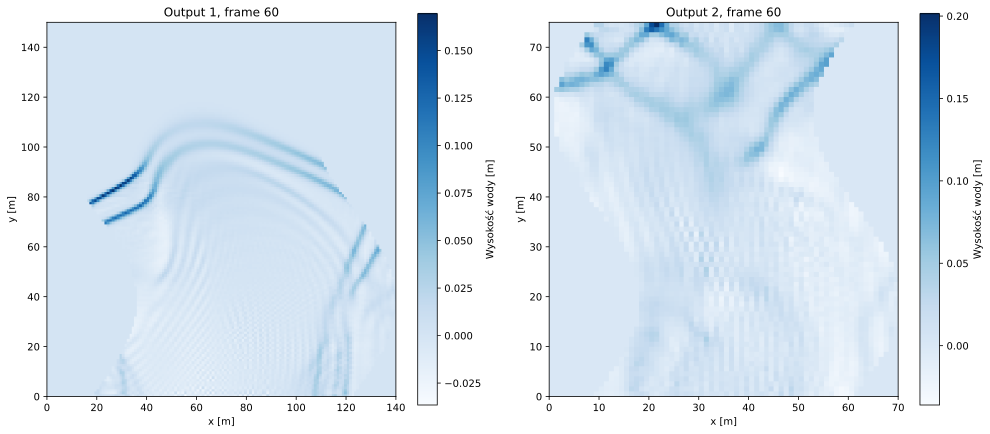

<Figure size 640x480 with 0 Axes>

In [55]:
imshow_river(frame_to_show=frame, output1=output30, output2=output30_2,
             bathymetry1=bathymetry_with_river, bathymetry2=bathymetry_with_river2,
             channel_mask1=channel_mask_full, channel_mask2=channel_mask_full2)
show_plot("rzeka_z_gory_sty1_f30_mniejszasiatka.pdf")


Poniżej znajduje się podobne porównanie, tym razem dla pola prędkości.
Tutaj niestety trudno dostrzec istotne różnice w wynikach, poza faktem, że dla mniejszej siatki krok
dx jest większy, a wektory prędkości pojawiają się rzadziej.

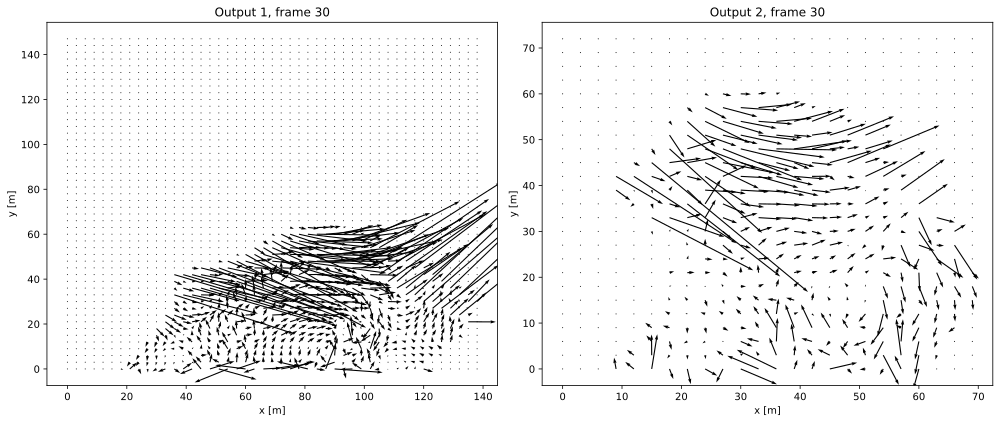

<Figure size 640x480 with 0 Axes>

In [56]:
frame = 50
quiver_river(
    frame_to_show=30,
    output1=output30, channel_mask1=channel_mask_full,
    output2=output30_2, channel_mask2=channel_mask_full2
)
show_plot("rzeka_z_gory_v_sty1_f30_mniejszasiatka.pdf")


**Sytuacja druga – odwrócony Gauss → wzniesienie na środku rzeki.
Tym razem rozpatrujemy drugą sytuację opisaną we wstępie, którą można zobrazować jako efekt wysypania żwiru i piasku na środku dna, skutkujący wzniesieniem w jego centralnej części.**

In [57]:
grid = (150, 140)

# współrzędne do bathymetrii (0..1)
x_lin = np.linspace(0, 1, grid[1])
y_lin = np.linspace(0, 1, grid[0])
X, Y = np.meshgrid(x_lin, y_lin)

river_width  = grid[1] / 10             # szerokość koryta
river_depth  = 0.3                      # głębokość koryta
meander_ampl = grid[1] / 8              # amplituda meandru
meander_freq = 2*np.pi / grid[0]        # 1 pełen meander na wysokość domeny

# bazowa bathymetria – lekki spadek wzdluz kierunku przeplywu
bathymetry = ( 0.5 + 0.1 * Y)

# ================================
# 3. Budowa rzeki (koryta) - bathymetrii
# ================================
bathymetry_with_river, channel_mask_full, river_center_x = make_river(
    bathymetry,
    grid,
    2,
    river_width,
    river_depth,
    meander_ampl,
    meander_freq
)

# ================================
# 4. Początkowe zaburzenie wody (fala wejściowa)
# ================================

# channel_mask dla wiersza 0
channel_mask = channel_mask_full[0, :]
profile_0 = river_depth * np.exp(-((x_lin - river_center_x[0])**2) / (2*river_width**2))


zeta = make_inflow_wave(grid, channel_mask,
    mode="flat_tapered",
    profile_0=profile_0,
    river_depth=river_depth,
    amplitude=0.2,
)

# ================================
# 5. Początkowy stan wody
# ================================
h_initial = bathymetry_with_river + zeta

# ================================
# 6. Integracja SW
# ================================
output05 = ShallowWaterEquationsIntegrator(
    h_initial=h_initial, bathymetry=bathymetry_with_river
)(
    nt=200, g=10, dt_over_dxy=(0.05, 0.05), outfreq=(outfreq := 3)
)

output30 = ShallowWaterEquationsIntegrator(
    h_initial=h_initial, bathymetry=bathymetry_with_river
)(
    nt=200, g=10, dt_over_dxy=(0.3, 0.3), outfreq=(outfreq := 3)
)


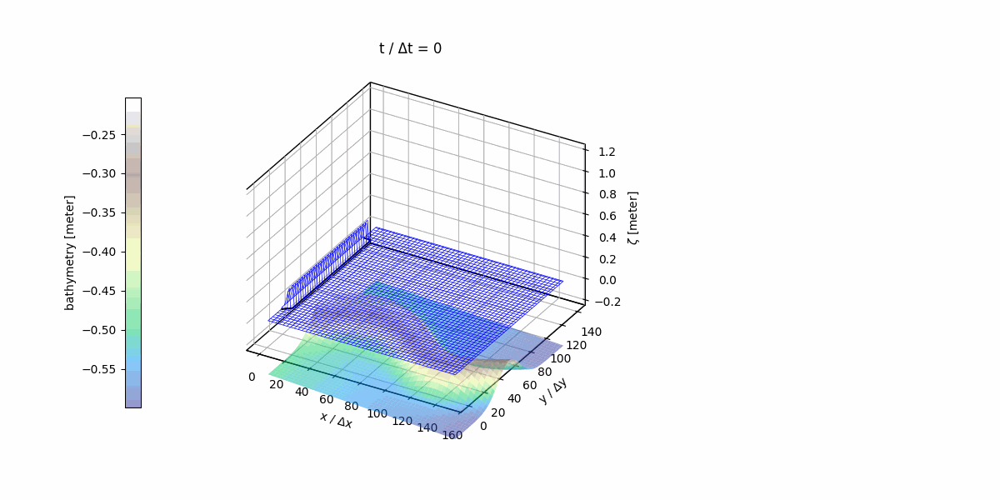

Button(description='tmpv018r48w.gif', style=ButtonStyle())

In [58]:
def plot(frame, *, zlim=(-.25, 1.25)):

    psi = output30['h'][frame]
    water_height = (psi - bathymetry_with_river) * channel_mask_full

    xi, yi = np.indices(psi.shape)
    fig, ax = pyplot.subplots(subplot_kw={"projection": "3d"}, figsize=(12, 6))
    ax.plot_wireframe(xi+.5, yi+.5, water_height, color='blue', linewidth=.5)
    ax.set(zlim=zlim, proj_type='ortho', title=f"t / Δt = {frame*outfreq}", zlabel=f"$\\zeta$ [{si.m}]")


    for axis in (ax.xaxis, ax.yaxis, ax.zaxis):
        axis.pane.fill = False
        axis.pane.set_edgecolor('black')
        axis.pane.set_alpha(1)
    for axis in ('x', 'y'):
        getattr(ax, f'set_{axis}label')(f"{axis} / Δ{axis}")
    # pyplot.colorbar(
    #     ax.contourf(xi+.5, yi+.5, bathymetry_with_river, zdir='z', offset=zlim[0]),
    #     pad=.1, aspect=10, fraction=.02, label='bathymetry', location='left'
    # ).ax.invert_yaxis()
    surf = ax.plot_surface(xi+.5, yi+.5, -(bathymetry_with_river), cmap='terrain', alpha=0.5)
    pyplot.colorbar(surf, pad=.1, fraction=.02, label=f'bathymetry [{si.m}]', location='left')
    ax.contour(xi+.5, yi+.5, water_height, levels=[0], colors='black', linewidths=1.5)


    return fig
show_anim(plot, range(len(output30['h'])))

Rzut na rzekę w klatce 60. Widać inny kształt dna (odwrócony Gauss) oraz fakt, że czoło fali na środku porusza się wolniej niż przy brzegach, co jest zgodne z oczekiwaniami dla takiej konfiguracji.

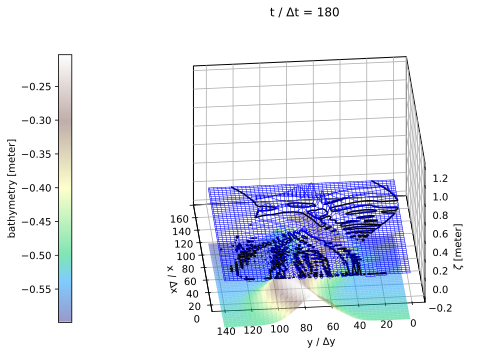

In [59]:
frame_to_show = 60
fig = plot(frame_to_show)
ax = fig.axes[0]
ax.view_init(elev=30, azim=175)
show_plot("Rzut_na_rzeke_klatka60_syt2.pdf")
pyplot.show()

Poniżej rzut na rzekę z góry (wychylenie wody). Widać falę poruszającą się podobnie jak wcześniej, ale z prędkością najmniejszą na środku. Sam „środek”, poruszający się najwolniej, przesunął się nieco w stronę prawego brzegu, co wynika najprawdopodobniej z jego obecności.

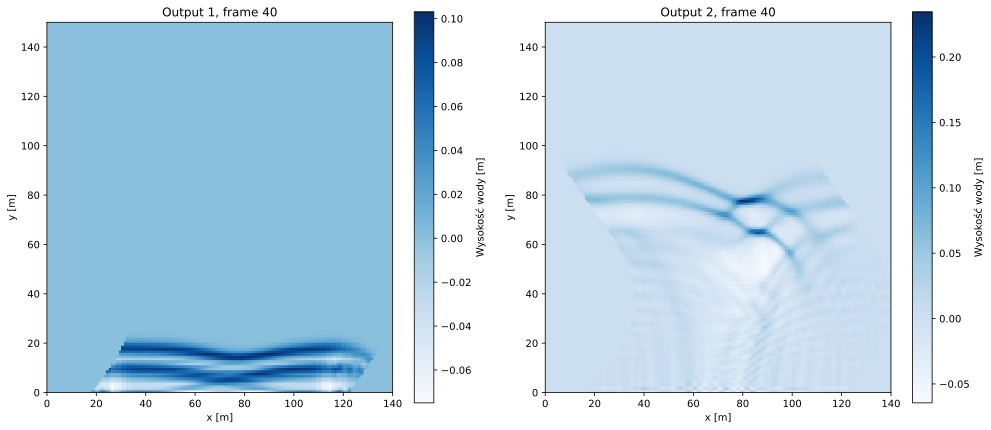

<Figure size 640x480 with 0 Axes>

In [60]:
frame = 40
imshow_river(frame_to_show=frame, output1=output05, output2=output30,
             bathymetry1=bathymetry_with_river, bathymetry2=bathymetry_with_river,
             channel_mask1=channel_mask_full, channel_mask2=channel_mask_full)
show_plot("rzeka_z_gory_syt2_f50.pdf")


Poniżej pole prędkości dla badanej sytuacji. Średnie prędkości są niższe niż poprzednio, co najpewniej wynika z innego kształtu dna i ostrych zmian głębokości przy samych brzegach. Widać także dużo wirów w okolicach zagłębień przy brzegach.

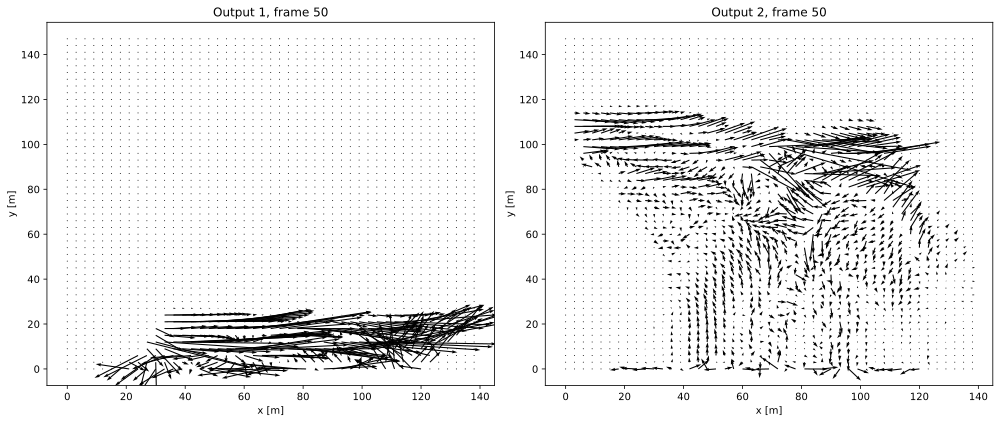

<Figure size 640x480 with 0 Axes>

In [61]:
quiver_river(
    frame_to_show=50,
    output1=output05, channel_mask1=channel_mask_full,
    output2=output30, channel_mask2=channel_mask_full
)
show_plot("rzeka_z_gory_v_sty2_f50.pdf")


### 5. Wnioski

W projekcie zbadano zachowanie się cieczy przy użyciu równań Shallow Water Equations (SWE) dla zamodelowanego koryta rzeki. Analizowano dwie różne sytuacje: naturalną rzekę, której głębokość jest największa w centralnej części i zgodnie z krzywą Gaussa stopniowo maleje ku brzegom, oraz rzekę z wyniesieniem na środku, co w praktyce może odpowiadać sytuacji wysypania dużej ilości żwiru i piasku na środku koryta przez przepływającą łódź.

***Sytuacja 1***

Początkowa fala została poprawnie odwzorowana w korycie rzeki dzięki łagodnemu wprowadzeniu za pomocą funkcji flat_tapered.

Fala rozchodzi się zgodnie z zadanym profilem głębokości: najwolniej przy brzegach i najszybciej w centralnej części koryta, co odpowiada spodziewanemu wpływowi batymetrii. Meandry koryta wpływają na kształt i propagację fali; widoczne są niewielkie zawirowania oraz przesunięcie czoła fali względem środka koryta w rejonach zakrętów.

Pole prędkości w fazie początkowej jest niestabilne i generuje liczne wiry. Często obserwuje się prędkości skierowane niemal prostopadle do brzegów, co jest zgodne z intuicyjną obserwacją fal uderzających prostopadle o linię brzegową.

Wraz z upływem czasu przepływ stabilizuje się: prędkości maleją, a fala stopniowo wygładza się.

Większy krok czasowy (dt/dx=0.3) zapewnia szybszą symulację, lecz wymaga ostrożności ze względu na stabilność obliczeń. Mniejszy krok (dt/dx=0.05) daje większą dokładność kosztem czasu obliczeń.
Zmniejszenie gęstości siatki powoduje spadek dokładności; widoczne jest większe „rozmycie” czoła fali oraz ogólne zwiększenie błędów numerycznych.

***Sytuacja 2***

W tym przypadku fala rozchodzi się najszybciej przy brzegach, a najwolniej w centralnej części koryta, co jest zgodne z zadanym odwrotnym profilem Gaussa. Również tutaj widoczny jest wpływ meandrów na propagację fali, analogiczny jak w sytuacji pierwszej.

Po pewnym czasie układ stabilizuje się, prędkości maleją, a główne czoło fali stopniowo zanika.

W tej sytuacji wykonano jedynie porównanie dla różnych kroków czasowych - otrzymane rezultaty są takie same.